In [1]:
import pandas as pd
import numpy as np

In [2]:
weather_df = pd.read_csv("weather.csv", index_col = "DATE")

In [3]:
weather_df

,STATION,NAME,ACMH,ACSH,AWND,FMTM,PGTM,PRCP,SNOW,SNWD,...,WT14,WT15,WT16,WT17,WT18,WT19,WT21,WT22,WV01,WV20
DATE,,,,,,,,,,,,,,,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",80.0,90.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",20.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",90.0,100.0,NaN,NaN,NaN,0.05,0.4,0.0,...,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",20.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",30.0,10.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,14.76,NaN,NaN,0.09,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,12.97,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,11.18,NaN,NaN,0.43,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Note: in the dataframe above , PRCP = rain per day, SNOW = snow per day, SNWD = snow depth on the surface

We then clean the data(NaN) in the dataframe

the null_percentage variable contains the percentage of null values in the dataframe in each column using the apply method, then use isnull to fee if the values in each column is null and return true or false,and then add how many times the null value occurs using .sum() and then divide with the number of rows in the dataframe using the dataframe.shape[0]

In [4]:
null_percentage = weather_df.apply(pd.isnull).sum()/weather_df.shape[0] *100

In [5]:
null_percentage

STATION     0.000000
NAME        0.000000
ACMH       50.217459
ACSH       50.214870
AWND       26.483380
FMTM       47.576887
PGTM       34.964275
PRCP        0.000000
SNOW        0.000000
SNWD        0.002589
TAVG       67.945532
TMAX        0.000000
TMIN        0.000000
TSUN       99.777364
WDF1       59.917676
WDF2       49.792896
WDF5       50.033654
WDFG       65.990991
WDFM       90.310138
WESD       68.388216
WSF1       59.907321
WSF2       49.792896
WSF5       50.036243
WSFG       59.915088
WSFM       90.310138
WT01       65.620793
WT02       95.221083
WT03       93.181112
WT04       98.226675
WT05       98.125712
WT06       99.052501
WT07       99.464119
WT08       77.604328
WT09       99.430465
WT11       99.914570
WT13       89.328984
WT14       95.557627
WT15       99.782541
WT16       66.410376
WT17       99.697111
WT18       93.761002
WT19       99.974112
WT21       99.981878
WT22       99.743709
WV01       99.997411
WV20       99.997411
dtype: float64

we can see from the percentages above that some colums have null values of over 50% hence those are not useable in the analysis and some have a very low percentage (fractions of a percentage). Those are well suited for the analysis

### We then take the columns where the null values are below 5%

In [6]:
valid_columns = weather_df.columns[null_percentage < 5]

In [7]:
valid_columns

Index(['STATION', 'NAME', 'PRCP', 'SNOW', 'SNWD', 'TMAX', 'TMIN'], dtype='object')

We can see that the usable columns in our analysis are Station, Name, Precipitation(PRCP), Snow, SNow Depth(SNWD), Max Temp(TMAX), Min Temp(TMIN)

We then take the valid columns for analysis

In [8]:
weather_df = weather_df[valid_columns].copy()

In [9]:
weather_df

,STATION,NAME,PRCP,SNOW,SNWD,TMAX,TMIN
DATE,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33


In [10]:
weather_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
PRCP,38628.0,0.120573,0.341077,0.0,0.0,0.0,0.04,7.8
SNOW,38628.0,0.068010,0.623261,0.0,0.0,0.0,0.00,30.3
SNWD,38627.0,0.213229,1.260271,0.0,0.0,0.0,0.00,28.0
TMAX,38628.0,62.250595,17.850867,8.0,48.0,63.0,78.00,104.0
TMIN,38628.0,48.256110,16.600537,-3.0,35.0,48.0,63.00,86.0


In [11]:
weather_df.index = pd.to_datetime(weather_df.index)

We have data from multiple locations i.e LAGUARDIA AIRPORT and JFK INTERNATIONAL AIRPORT. I will look at the column called "Station" since these are the unique station Id's and find the unique values in this column. This allows us to split the data using the unique ID and then merge the dataframes by using the date (which is our index).
This splits the data into two, (data from LAGUARDIA AIRPORT & JFK INTERNATIONAL AIRPORT) bcoz we hape duplicate dates in the current dataframe. (i.e we have two observations for one day hence the duplicates)

In [12]:
weather_df["STATION"].unique()

array(['USW00014732', 'USW00094789'], dtype=object)

Let's take the data from LAGUARDIA station from its station ID

In [13]:
laguardia = weather_df[weather_df["STATION"] == "USW00014732"].copy()

In [14]:
laguardia

,STATION,NAME,PRCP,SNOW,SNWD,TMAX,TMIN
DATE,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...
2022-11-13,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43
2022-11-14,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38
2022-11-15,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36


Let's take the data from JFK station from its station ID

In [15]:
JFK = weather_df[weather_df["STATION"] == "USW00094789"].copy()

In [16]:
JFK

,STATION,NAME,PRCP,SNOW,SNWD,TMAX,TMIN
DATE,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33


we then merge the two dataframes using Date(i.e the index column)

In [17]:
weather_df = JFK.merge(laguardia, left_index = True, right_index = True)

In [18]:
weather_df

,STATION_x,NAME_x,PRCP_x,SNOW_x,SNWD_x,TMAX_x,TMIN_x,STATION_y,NAME_y,PRCP_y,SNOW_y,SNWD_y,TMAX_y,TMIN_y
DATE,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36


From the above we can see that the columns have been renamed. The JFK are the x-columns and the LAGUARDA are the y-columns

## Let us now try to predict the future temperature at JFK airport

In [19]:
weather_df["y"] = weather_df.shift(-1)["TMAX_x"] 

In [20]:
weather_df[["TMAX_x", "y"]]

,TMAX_x,y
DATE,,
1970-01-01,28,31.0
1970-01-02,31,38.0
1970-01-03,38,31.0
1970-01-04,31,35.0
1970-01-05,35,36.0
...,...,...
2022-11-13,61,47.0
2022-11-14,47,46.0
2022-11-15,46,53.0


In the above dataframe we take the maximum daily temperature at JFK and derive 'y' which is a pulled back version of 'TMAX_x'. In essence 'y' is tomorow's temperature and hence the last value is a missing value (NaN)

This shows that we can use today's maximum temperature(TMAX) to forecast tomorow's maximum temperature(y)

We then fill the values in the dataframe usinf the Forward Fill function .ffill(), which will take yesterday's temp and fill the missing Null value

In [21]:
weather_df = weather_df.ffill()

In [22]:
weather_df

,STATION_x,NAME_x,PRCP_x,SNOW_x,SNWD_x,TMAX_x,TMIN_x,STATION_y,NAME_y,PRCP_y,SNOW_y,SNWD_y,TMAX_y,TMIN_y,y
DATE,,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21,31.0
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19,38.0
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26,31.0
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22,35.0
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21,36.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43,47.0
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38,46.0
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36,53.0


We can now see the "y" values ,plus any null values are filled in the weather dataframe

Our target column 'y' is now set up. NOte that the column is always setup as 'y' in order for Prophet to work.
We then create a column "ds" whish is the date of every observation. In this example we will use the date/time column which is our index.
Prophet requires it to be callled "ds" or it will not work

In [23]:
weather_df["ds"] = weather_df.index

In [24]:
weather_df

,STATION_x,NAME_x,PRCP_x,SNOW_x,SNWD_x,TMAX_x,TMIN_x,STATION_y,NAME_y,PRCP_y,SNOW_y,SNWD_y,TMAX_y,TMIN_y,y,ds
DATE,,,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21,31.0,1970-01-01
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19,38.0,1970-01-02
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26,31.0,1970-01-03
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22,35.0,1970-01-04
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21,36.0,1970-01-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43,47.0,2022-11-13
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38,46.0,2022-11-14
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36,53.0,2022-11-15


In the end of our weather dataframe we can see the "y" and "ds" columns that we created

### We then create a list of predictors that will be used to predict the "Y" column. We will also drop the columns that will not be used in the machine learning model

The code below basicaly takes everything in the dataframe except "y", "NAME_x", "STATION_x", "NAME_y", "STATION_y", "ds". This is bcoz we cannot use "y" to predict "y" and "ds" duplicates the indes while the names and ID's of the stations are strings that do not contribute to the model

In [25]:
predictors = weather_df.columns[~weather_df.columns.isin(["y", "NAME_x", "STATION_x", "NAME_y", "STATION_y", "ds"])]

In [26]:
predictors

Index(['PRCP_x', 'SNOW_x', 'SNWD_x', 'TMAX_x', 'TMIN_x', 'PRCP_y', 'SNOW_y',
       'SNWD_y', 'TMAX_y', 'TMIN_y'],
      dtype='object')

The predictors are basically the columns used to predict the future max temperatures

### We then split our data into train set and test set using the index (i.e ,the dates[ from this date to this date])

In [27]:
train = weather_df[: "2021-12-31"]
test = weather_df["2021-12-31": ]

In the cell above we can interprate the training data as take from (1970-01-01) to (2021-12-31) 
and the test data from (2021-12-31) to (the current date)
(1970-01-01) is the first date data was collected

In [29]:
!pip install prophet

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     -------------------------------------- 12.1/12.1 MB 675.6 kB/s eta 0:00:00
     -------------------------------------- 47.9/47.9 kB 400.9 kB/s eta 0:00:00
     ------------------------------------ 196.0/196.0 kB 566.3 kB/s eta 0:00:00
     -------------------------------------- 83.2/83.2 kB 584.0 kB/s eta 0:00:00
     ---------------------------------------- 5.8/5.8 MB 732.1 kB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ---------------------------------------- 1.4/1.4 MB 833.8 kB/s eta 0:00:00
  Created wheel for pymeeus: filename=PyMeeus-0.5.12-py3-none-any.whl size=732001 sha256=9ea74a6ae8228b5909b0fd79b5f345757821afa973950111f1750c81e28c4f62
  Stored in directory: C:\Users\SideEffect\AppData\Local\Temp\pip-ephem-wheel-cache-lyohzh9x\wheels\9b\0a\31\eb0e590d74ec13e90493cb6d1cd92a379a1a3b8f12ed778a14
Successfully built pymeeus


In [30]:
from prophet import Prophet

In [31]:
def fit_prophet(train):
    m = Prophet()
    for p in predictors:
        m.add_regressor(p)
    m.fit(train)
    return m

m = fit_prophet(train)

22:03:37 - cmdstanpy - INFO - Chain [1] start processing
22:03:54 - cmdstanpy - INFO - Chain [1] done processing


In the cell above we create a function named fit_prophet which takes in the argument train. We then initialize the prophet class using a variable 'm'. We then loop through our predictors and add the predictors as additional regressors( the additional regressors help predict the "y", i.e tomorows temperature). Basically these columns ((['PRCP_x', 'SNOW_x', 'SNWD_x', 'TMAX_x', 'TMIN_x', 'PRCP_y', 'SNOW_y',
'SNWD_y', 'TMAX_y', 'TMIN_y'])), are additional regressors(add_regressor). We then fit our prophet model to our training data {m.fit(train)}. And in the end we will return our fit prophet model 'm' .
We then call the function and passing our training data by {m = fit_model(train)}

In [32]:
predictions = m.predict(test)

In the above we create a variable called predictions ,then generate the predictions on out test set.NOte we assigned the Prophet() module to the variable 'm'

In [33]:
predictions

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,PRCP_x,PRCP_x_lower,PRCP_x_upper,PRCP_y,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-12-31,61.451789,43.627927,59.003934,61.451789,61.451789,0.021158,0.021158,0.021158,0.039689,...,0.024395,0.024395,0.024395,-7.789165,-7.789165,-7.789165,0.0,0.0,0.0,51.282221
1,2022-01-01,61.451564,44.628412,59.682407,61.451564,61.451564,-0.215600,-0.215600,-0.215600,-0.204790,...,-0.016400,-0.016400,-0.016400,-7.831998,-7.831998,-7.831998,0.0,0.0,0.0,51.979276
2,2022-01-02,61.451340,41.537756,56.807723,61.451340,61.451340,0.017244,0.017244,0.017244,0.026821,...,0.092322,0.092322,0.092322,-7.872761,-7.872761,-7.872761,0.0,0.0,0.0,49.569291
3,2022-01-03,61.451115,31.028811,46.356215,61.451115,61.451115,0.023114,0.023114,0.023114,0.039689,...,0.327882,0.327882,0.327882,-7.911487,-7.911487,-7.911487,0.0,0.0,0.0,38.558509
4,2022-01-04,61.450890,28.944996,43.799607,61.450890,61.450890,0.023114,0.023114,0.023114,0.039689,...,-0.092811,-0.092811,-0.092811,-7.948196,-7.948196,-7.948196,0.0,0.0,0.0,36.151871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317,2022-11-13,61.380525,48.944295,64.170552,61.362080,61.389159,0.005504,0.005504,0.005504,0.033255,...,0.092322,0.092322,0.092322,-2.985346,-2.985346,-2.985346,0.0,0.0,0.0,56.341881
318,2022-11-14,61.380300,42.778714,57.418532,61.361682,61.389052,0.023114,0.023114,0.023114,0.039689,...,0.327882,0.327882,0.327882,-3.123147,-3.123147,-3.123147,0.0,0.0,0.0,50.236887
319,2022-11-15,61.380075,42.109677,56.669260,61.361364,61.388945,-0.061023,-0.061023,-0.061023,-0.117936,...,-0.092811,-0.092811,-0.092811,-3.260299,-3.260299,-3.260299,0.0,0.0,0.0,49.300898
320,2022-11-16,61.379851,43.339157,58.413500,61.360789,61.388776,-0.016019,-0.016019,-0.016019,-0.024648,...,-0.262147,-0.262147,-0.262147,-3.396721,-3.396721,-3.396721,0.0,0.0,0.0,50.675021


Our predicted temperature is the last column called 'yhat'. I.e ,for each day of 2022 and the last day of 2021 we have the predicted temperature in the 'yhat' column

Prophet does time series forecasting. It picks out alot of different components from the time series and tries to model how that time seiries will change. We can see this by plotting the different components that go into the prophet prediction

In [34]:
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric

<AxesSubplot:xlabel='ds'>

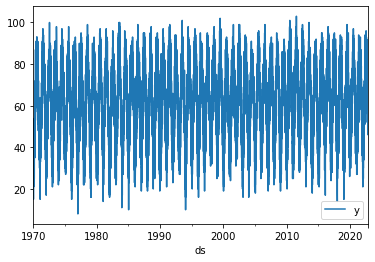

In [35]:
weather_df.plot("ds", "y")
#we visualise the temperature over time from 1970

<AxesSubplot:xlabel='ds'>

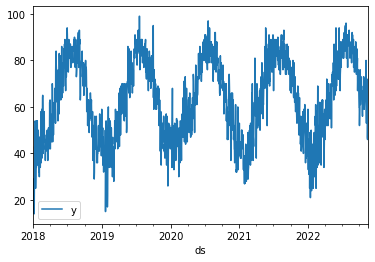

In [36]:
weather_df["2018-01-01":].plot("ds", "y")
#we then visualise the temperature over time from 2018 to the current time
#we can see tyhat during the summer(at the peaks),temperatures are high and during the winter(at the troughs)temperatures are low
#This trend repeats over time. This is known as a seasonal pattern

In [37]:
plot_components_plotly(m, predictions)

The factors above are separated by Prophet and show how much they affect the prediction. i.e, the weekly trend and how much it affects the weather, the yearly trend and how much it affects the weather, The extra regressors and how much they affect the weather, and the trend in temperature over time(in years)

### We then look at how important each column is to prophet's prediction

In [38]:
from prophet.utilities import regressor_coefficients

we then run the regressor_coefficients on our trained model m

In [39]:
regressor_coefficients(m)

,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,PRCP_x,additive,0.118130,-0.195667,-0.195667,-0.195667
1,SNOW_x,additive,0.064540,-0.011915,-0.011915,-0.011915
2,SNWD_x,additive,0.209635,0.063296,0.063296,0.063296
3,TMAX_x,additive,61.758648,0.012399,0.012399,0.012399
4,TMIN_x,additive,47.494024,-0.083919,-0.083919,-0.083919
5,PRCP_y,additive,0.123378,-0.321682,-0.321682,-0.321682
6,SNOW_y,additive,0.071347,-0.491140,-0.491140,-0.491140
7,SNWD_y,additive,0.217759,-0.201450,-0.201450,-0.201450
8,TMAX_y,additive,62.609277,0.281497,0.281497,0.281497
9,TMIN_y,additive,48.923130,0.427295,0.427295,0.427295


we then measure how effective the model was using the mean squared error

In [40]:
predictions.index = test.index
predictions["actual"] = test["y"]

In [41]:
def MeanSquaredError(predictions, actual_label = "actual", pred_label = "yhat"):
    squareError = ((predictions[actual_label] - predictions[pred_label]) **2)
    print("MeanSquared Error is:", squareError.mean())

In [42]:
MeanSquaredError(predictions)

MeanSquared Error is: 40.538174270609524


#### We then evalueate the Prophet model across the entire data setusing Cross Validation beacuse in the above we got the mean squared error for only 2022.

Cross validation splits our data into multiple pieces and uses the first piece for example to predict the second piece. It then puts the first and second piece together and uses it to predict the third piece. This ensures we are not using the same data to train and test the model but enables us to still get an error metric across a good portion of our data

In [43]:
from prophet.diagnostics import cross_validation

in the reoss validation, we have a variable called initial which is the initial number of days of training data we want before we start making predictions(365 *5) means 365 days with 5 years of data. The variable preiod is how often we want to train a new model(eg every 180 days), The horizon variable is how many days we want to make a prediction for.

In [44]:
m = fit_prophet(weather_df)
CrossValidation = cross_validation(m, initial = f"{365 * 5}days", period = "180 days", horizon = "180 days", parallel = "processes")

22:05:02 - cmdstanpy - INFO - Chain [1] start processing
22:05:21 - cmdstanpy - INFO - Chain [1] done processing


In [45]:
MeanSquaredError(CrossValidation, actual_label = "y")

MeanSquared Error is: 36.179305024625876


In the above cell we took our mean squared error function and passed the cross validation and we will get the error across the entire data set. We can see that the error across the entire data set is lower than the error across 2022. Hence we can say that our general purpose MSE is 36

<AxesSubplot:>

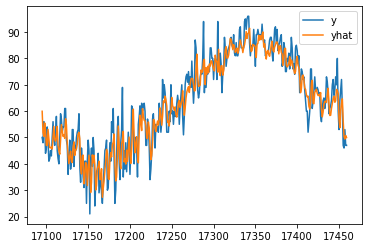

In [46]:
CrossValidation[["y", "yhat"]][-365:].plot()

We take a look at the y and yhat and plot the last 365 days.We see that the predicted y valuse follow the trend of yhat but there are some spikes that to not. This could be because of some factors that prophet cannot account for.eg wind patterns from other areas that affect the selected area etc

### We then make future predictions

we first use the model to predict one day ahead

In [47]:
m = fit_prophet(weather_df)
m.predict(weather_df.iloc[-1:])

22:22:53 - cmdstanpy - INFO - Chain [1] start processing
22:23:11 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,PRCP_x,PRCP_x_lower,PRCP_x_upper,PRCP_y,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2022-11-17,61.655414,42.932329,57.856894,61.655414,61.655414,0.028302,0.028302,0.028302,0.033906,...,-0.065223,-0.065223,-0.065223,-3.561064,-3.561064,-3.561064,0.0,0.0,0.0,50.124602


The iloc uses the last row in the dataframe which is the yhat value. From the above the predicted temperature for the next day is yhat = 50.127879 degrees. The prediction is accurate but can oly be done one day ahead 

#### We can also predict for multiple days ahead but the predictions tend to be inaccurate

In [48]:
m = Prophet()
m.fit(weather_df)
future = m.make_future_dataframe(periods = 365)

# periods = 365 is the next number of days i.e one year

22:23:28 - cmdstanpy - INFO - Chain [1] start processing
22:23:33 - cmdstanpy - INFO - Chain [1] done processing


In [49]:
future

,ds
0,1970-01-01
1,1970-01-02
2,1970-01-03
3,1970-01-04
4,1970-01-05
...,...
19674,2023-11-13
19675,2023-11-14
19676,2023-11-15
19677,2023-11-16


In [50]:
forecast = m.predict(future)

In [51]:
#we then plot for predictions for a full year ahead

plot_plotly(m, forecast)

The black dots are the actual values and the blue line is the predicted values. We can also see we do not have actual values beyond the present day but have predicted values upto a year ahead for temperature. We can also do this for multiple years but the result will be more inaccurate the further out we go.